# IMC Lung Infection Dataset

Original data from: [The spatial landscape of lung pathology during COVID-19 progression - raw IMC data](https://zenodo.org/record/4110560#.YjoukOrMIQ8) by Andre Rendeiro et al. (Nautre, 2021)

## Loading Libraries and Data

In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc
import seaborn as sns
from utag import utag

from utag.utils import celltype_connectivity
from utag.visualize import (
    add_scale_box_to_fig,
    add_spatial_image,
    adj2chord,
)

sc.settings.set_figure_params(dpi=200, dpi_save=300, fontsize=6)

Warning, OS could not be easily identified. Using default dir ~/.utag to store resources but that might not work!


## Reading in preprocessed data

In [3]:
adata = sc.read("data/infected_lung_adata.h5ad")
adata

C:\Users\jkim0\anaconda3\envs\utag\lib\site-packages\anndata\_core\anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


AnnData object with n_obs × n_vars = 664006 × 43
    obs: 'roi', 'sample', 'disease', 'phenotypes', 'acquisition_id', 'acquisition_date', 'obj_id', 'cluster_1.0', 'cluster_label', 'metacluster_label', 'X', 'Y'
    uns: 'leiden', 'metacluster_label_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

The following code below requires `adata.obsm['spatial']` which in this case contains `adata.obs[['Y_centroid', 'X_centroid']]` as a `numpy.ndarray`. Other useful feature includes `adata.obs['Slide']` which contains keys identifying each slides.

# Running UTAG

In [5]:
%%time

results = utag(
    adata,
    slide_key="roi",
    max_dist=20,
    normalization_mode="l1_norm",
    apply_clustering=True,
    resolutions=[0.05, 0.1, 0.3],
    parc_pcs=10,
    clustering_method=["leiden"],
)

C:\Users\jkim0\anaconda3\envs\utag\lib\site-packages\anndata\_core\anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


Applying UTAG Algorithm...


  0%|          | 0/3 [00:00<?, ?it/s]

Applying Leiden Clustering at Resolution: 0.05...


 33%|███▎      | 1/3 [01:46<03:33, 106.92s/it]

Applying Leiden Clustering at Resolution: 0.1...


 67%|██████▋   | 2/3 [07:43<04:13, 253.96s/it]

Applying Leiden Clustering at Resolution: 0.3...


100%|██████████| 3/3 [1:02:33<00:00, 1251.25s/it]

Wall time: 1h 4min 57s


In [75]:
results

AnnData object with n_obs × n_vars = 664006 × 43
    obs: 'roi', 'sample', 'disease', 'phenotypes', 'acquisition_id', 'acquisition_date', 'obj_id', 'cluster_1.0', 'cluster_label', 'metacluster_label', 'X', 'Y', 'UTAG Label_leiden_0.05', 'UTAG Label_leiden_0.1', 'UTAG Label_leiden_0.3', 'UTAG Label_parc_0.3', 'UTAG Label_parc_0.05', 'UTAG Label_parc_0.1', 'UTAG Label_parc_1.0', 'UTAG Label_parc_0.5'
    uns: 'pca', 'neighbors', 'leiden', 'umap', 'UTAG Label_leiden_0.3_colors', 'UTAG Label_leiden_0.1_colors', 'UTAG Label_parc_0.3_colors', 'dendrogram_UTAG Label_leiden_0.1', 'dendrogram_UTAG Label_parc_0.3', 'dendrogram_UTAG Label_leiden_0.3', 'dendrogram_UTAG Label_leiden_0.05', 'UTAG Label_parc_0.1_colors', 'UTAG Label_parc_1.0_colors', 'UTAG Label_parc_0.5_colors', 'dendrogram_UTAG Label_parc_0.5'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

## Annotating UTAG Labels

In [3]:
adata = sc.read("data/infected_lung_expression.h5ad")
results = sc.read("data/infected_lung_results.h5ad")

C:\Users\jkim0\anaconda3\envs\utag\lib\site-packages\anndata\_core\anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [5]:
plt.ioff()
cm = sns.clustermap(results.to_df().corr(), cmap="coolwarm", vmin=-1, vmax=1)
var_order = results.var.iloc[cm.dendrogram_col.reordered_ind].index
plt.ion()

In [ ]:
sc.settings.set_figure_params(dpi=150, fontsize=10)
sc.pl.matrixplot(
    results,
    var_names=var_order,
    groupby="UTAG Label_parc_0.3",
    dendrogram=True,
    cmap="coolwarm",
    vmin=-1,
    vmax=1,
    show=True
    # save="healthy_lung UTAG Expression",
)

In [7]:
results.obs["UTAG Label"] = results.obs["UTAG Label_parc_0.3"]
adata.obs["UTAG Label"] = pd.Categorical(results.obs["UTAG Label"])

Trying to set attribute `.uns` of view, copying.


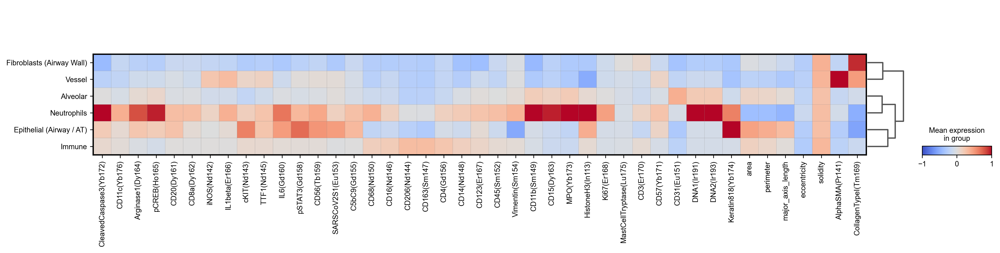

In [10]:
import seaborn as sns

utag_mapper = {
    "0": "Alveolar",
    "1": "Immune",
    "2": "Fibroblasts (Airway Wall)",
    "3": "Immune",
    "4": "Immune",
    "5": "Vessel",
    "6": "Epithelial (Airway / AT)",
    "7": "Epithelial (Airway / AT)",
    "8": "Neutrophils",
}


results.obs["UTAG Label"] = pd.Categorical(
    results.obs["UTAG Label_parc_0.3"].astype(str).replace(utag_mapper),
    categories = ['Epithelial (Airway / AT)', 'Fibroblasts (Airway Wall)', 'Alveolar', 'Immune', 'Vessel', 'Neutrophils']
)
results = results[~results.obs["UTAG Label"].isna()]


adata.obs["UTAG Label"] = pd.Categorical(results.obs["UTAG Label"])
adata.uns["UTAG Label_colors"] = (sns.color_palette("tab10").as_hex()[:4] + sns.color_palette("tab10").as_hex()[5:])[
    : len(adata.obs["UTAG Label"].unique())
]

results.uns["UTAG Label_colors"] = adata.uns["UTAG Label_colors"]

adata.obs["cell_type"] = adata.obs["metacluster_label"].replace(
    {"nan": "Low Expression"}
)
adata.uns["cell_type_colors"] = sns.color_palette("colorblind").as_hex()[
    : len(adata.obs["cell_type"].unique())
]
del results.uns["dendrogram_UTAG Label"]
sc.settings.set_figure_params(dpi=150, fontsize=10)
sc.pl.matrixplot(
    results,
    var_names=var_order,
    groupby="UTAG Label",
    dendrogram=True,
    cmap="coolwarm",
    vmin=-1,
    vmax=1,
    show=True,
    #save="infected_lung_expression_annotated",
)

disease_colors = sns.color_palette(['#00a1d5', '#79af97', '#df8f44', '#565552', '#62466B', '#BA1200'])

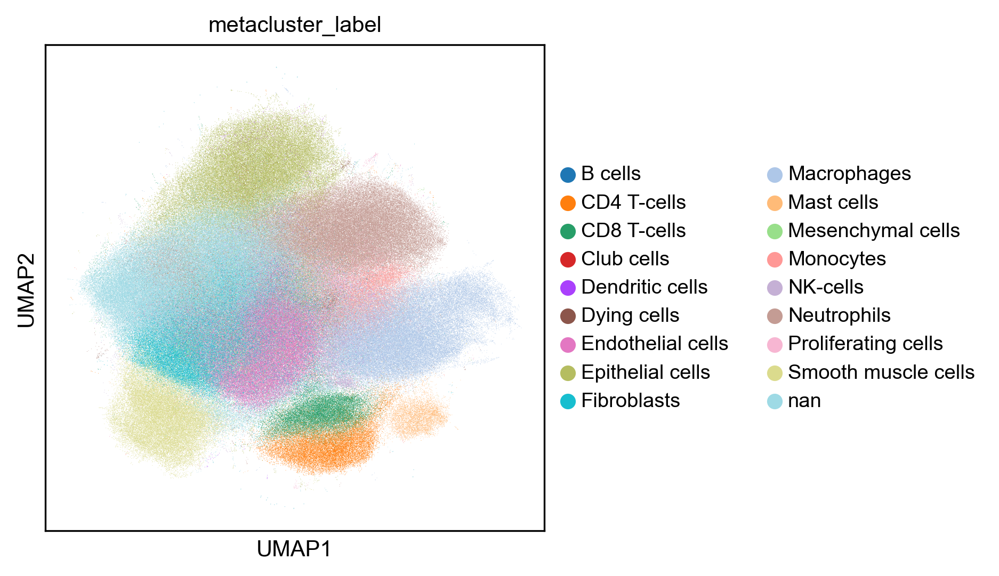

In [11]:
sc.pl.umap(adata, color = 'metacluster_label')

## Domain Cell Type Proportions and Interaction Analysis

C:\Users\jkim0\anaconda3\envs\utag\lib\site-packages\seaborn\axisgrid.py:643: UserWarning: Using the barplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


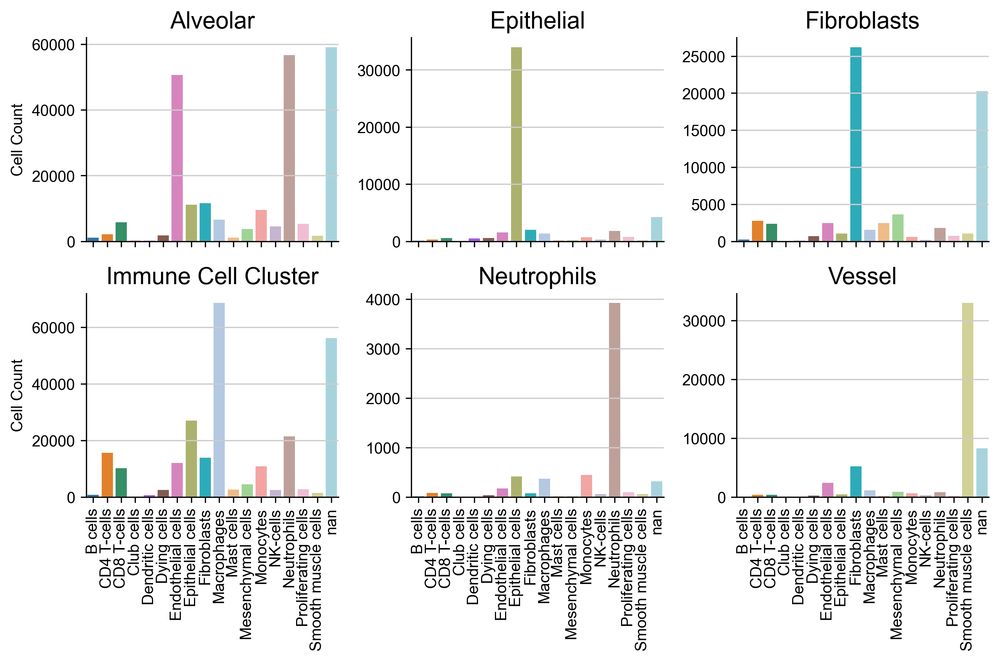

In [156]:
import seaborn as sns

g = sns.FacetGrid(
    data=results.obs.groupby(["metacluster_label", "UTAG Label"])
    .count()["sample"]
    .reset_index(),
    hue="metacluster_label",
    col="UTAG Label",
    col_wrap=3,
    aspect=1,
    hue_kws={"color": adata.uns["metacluster_label_colors"].tolist()},
    sharey=False,
)

g.map(sns.barplot, "metacluster_label", "sample")

# iterate over axes of FacetGrid
for i, ax in enumerate(g.axes.flat):
    labels = ax.get_xticklabels()  # get x labels
    ax.set_xticklabels(labels, rotation=90, fontsize=10)  # set new labels
    titles = ax.get_title()
    titles = titles.replace("UTAG Label = ", "")
    ax.set_title(titles, fontsize=15)
    if i == 0 or i == 3:
        ax.set_ylabel("Cell Count", fontsize=10)
    else:
        ax.set_ylabel("", fontsize=12)
    ax.set_xlabel("")
plt.tight_layout()
plt.savefig("figures/infected_lung_Domain Composition.pdf")

## UTAG Label UMAP

In [157]:
slide_key = "roi"
celltype_key = "metacluster_label"
domain_key = "UTAG Label"
tmp = celltype_connectivity(
    adata=adata[adata.obs[slide_key].isin(adata.obs[slide_key].unique())],
    slide_key=slide_key,
    domain_key=domain_key,
    celltype_key=celltype_key,
)

100%|██████████| 237/237 [29:42<00:00,  7.52s/it]
Trying to set attribute `.uns` of view, copying.


In [35]:
glob_fig = []
import holoviews as hv

hv.extension("svg")
for label in tmp.uns["UTAG Label_celltype_adjacency_matrix"].keys():
    print(label)
    order = adata.obs["metacluster_label"].cat.categories
    fig = adj2chord(
        tmp.uns["UTAG Label_celltype_adjacency_matrix"][label].loc[order, order],
        size=100,
    )
    fig.opts(
        title=label,
        fontsize={"title": 20, "labels": 0, "xticks": 0, "yticks": 0, "legend": 0},
        labels=None,
        edge_cmap=adata.uns["metacluster_label_colors"].tolist(),
        node_color=adata.uns["metacluster_label_colors"].tolist(),
    )
    glob_fig.append(fig)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

Immune Infiltration
Epithelial
Alveolar
Fibroblasts
Vessel
Neutrophils


In [36]:
(
    glob_fig[0] + glob_fig[2] + glob_fig[1] + glob_fig[4] + glob_fig[5] + glob_fig[3]
).cols(3)

:Layout
   .Chord.I   :Chord   [source,target]   (value)
   .Chord.II  :Chord   [source,target]   (value)
   .Chord.III :Chord   [source,target]   (value)
   .Chord.IV  :Chord   [source,target]   (value)
   .Chord.V   :Chord   [source,target]   (value)
   .Chord.VI  :Chord   [source,target]   (value)

In [37]:
hv.save(
    (
        glob_fig[0]
        + glob_fig[2]
        + glob_fig[1]
        + glob_fig[4]
        + glob_fig[5]
        + glob_fig[3]
    ).cols(3),
    "figures/infected_lung_within_domain_celltype_interaction.pdf",
    fmt="pdf",
)

## Visualization of Domain-Domain Interaction

In [45]:
adata

AnnData object with n_obs × n_vars = 664006 × 43
    obs: 'roi', 'sample', 'disease', 'phenotypes', 'acquisition_id', 'acquisition_date', 'obj_id', 'cluster_1.0', 'cluster_label', 'metacluster_label', 'X', 'Y', 'UTAG Label', 'cell_type'
    uns: 'leiden', 'metacluster_label_colors', 'neighbors', 'pca', 'umap', 'UTAG Label_colors', 'cell_type_colors'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [107]:
from utag.utils import measure_per_domain_cell_type_colocalization

image_key = "roi"
utag_key = "UTAG Label"

disease = dict()
for d in adata.obs["phenotypes"].cat.categories:
    disease[d] = list()

for img in tqdm(adata.obs[image_key].unique()):

    a_ = adata[adata.obs[image_key] == img].copy()
    odd = measure_cell_type_adjacency(a_, utag_key, n_iterations=100)
    disease[a_.obs["phenotypes"].unique()[0]].append(odd)

# odds = pd.concat(odds)
# odds = odds.groupby(level=0).sum()

100%|██████████| 237/237 [1:12:49<00:00, 18.44s/it]


In [136]:
adata.obs["phenotypes"].cat.categories

Index(['Healthy', 'Flu', 'ARDS', 'Pneumonia', 'COVID19_early', 'COVID19_late'], dtype='object')

In [154]:
disease_adj_list = []
for d_ in disease:
    for i, adj in enumerate(disease[d_]):
        disease_df_tmp = (
            pd.melt(adj, ignore_index=False).reset_index().sort_values("index")
        )
        disease_df_tmp["phenotype"] = d_
        disease_df_tmp["slide_idx"] = i
        disease_adj_list.append(disease_df_tmp)
disease_df = pd.concat(disease_adj_list, ignore_index=True)
disease_df.to_csv('domain_interaction_log_likelihood_values.csv')

['Healthy' 'Flu' 'ARDS' 'Pneumonia' 'COVID19_early' 'COVID19_late']


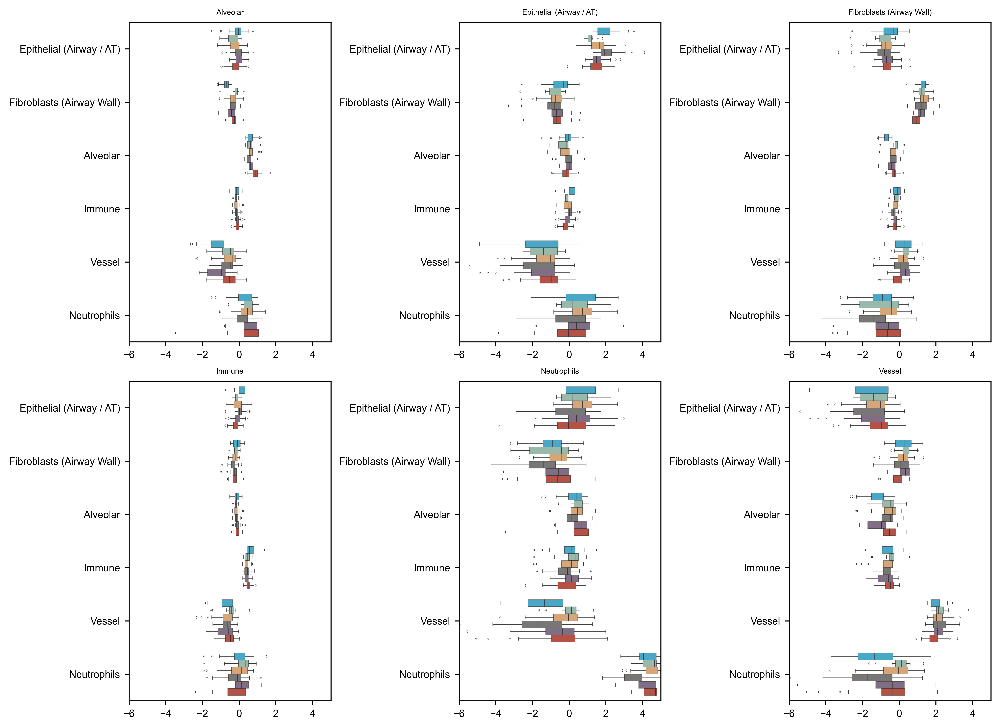

In [114]:
disease_df['variable'] = disease_df['variable'].astype('category')

print(disease_df['phenotype'].unique())
fig, ax = plt.subplots(2, 3, figsize=(11, 8), dpi=300)
for i, domain in enumerate(disease_df["variable"].cat.categories):
    i_, j_ = int(i / 3), i % 3
    df_ = disease_df[disease_df["variable"] == domain]
    sns.boxplot(
        data=df_,
        y="index",
        x="value",
        hue="phenotype",
        palette = disease_colors,
        dodge=True,
        ax=ax[i_, j_],
        boxprops=dict(alpha=0.8),
        fliersize=0.1,
        linewidth=0.3
    )

    ax[i_, j_].set_title(domain)
    ax[i_, j_].set_ylabel("")
    ax[i_, j_].set_xlabel("")
    ax[i_][j_].legend_ = None
    ax[i_, j_].set_xlim(-6,5)
plt.tight_layout()
plt.savefig('figures/infected_lung_domain_odds_1.pdf', bbox_inches = 'tight')
plt.show()

C:\Users\jkim0\AppData\Local\Temp/ipykernel_30224/1361730147.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_['index'] = pd.Categorical(df_['index'], categories = ['Alveolar', 'Fibroblasts (Airway Wall)', 'Vessel'])


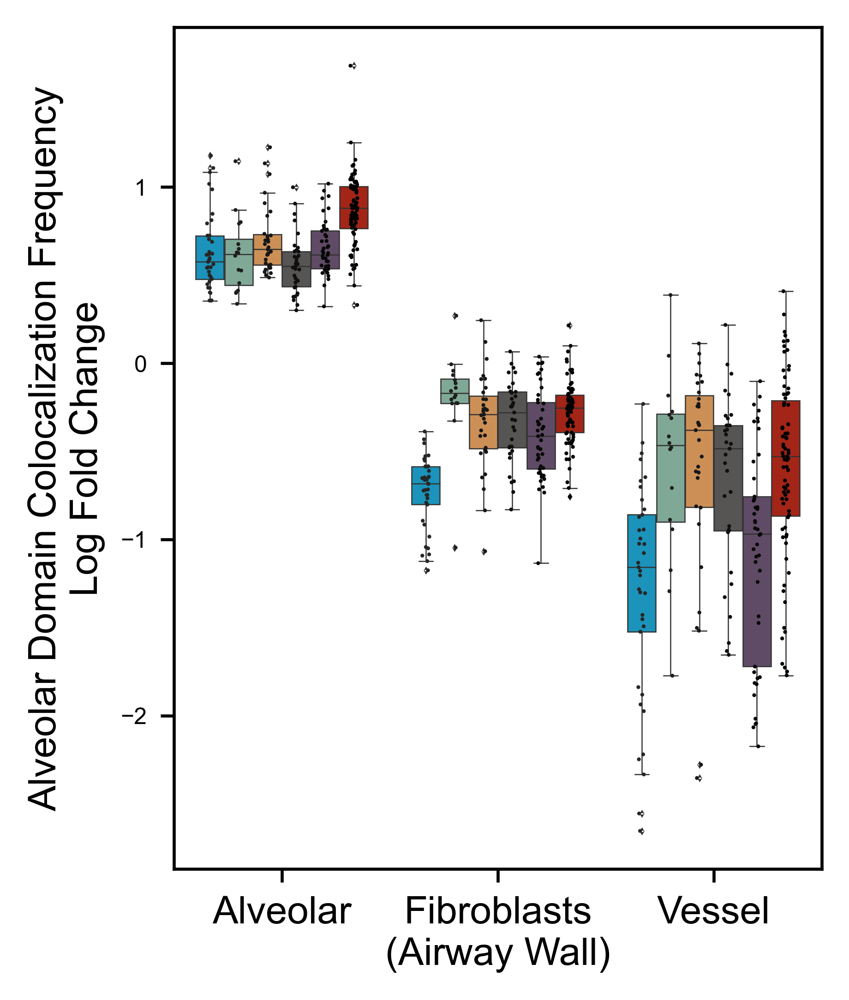

In [174]:

matplotlib.rcParams["pdf.fonttype"] = 42
matplotlib.rcParams["ps.fonttype"] = 42
matplotlib.rcParams["axes.grid"] = False

fig, ax = plt.subplots(1, 1, figsize = (3,4))
df_ = disease_df[(disease_df["index"].isin(['Alveolar', 'Fibroblasts (Airway Wall)', 'Vessel'])) & (disease_df["variable"] == 'Alveolar')]
df_['index'] = pd.Categorical(df_['index'], categories = ['Alveolar', 'Fibroblasts (Airway Wall)', 'Vessel'])
sns.boxplot(
        data=df_,
        x="index",
        y="value",
        hue="phenotype",
        palette = disease_colors,
        dodge=True,
        fliersize=0.1,
        linewidth=0.3
)

sns.stripplot(
        data=df_,
        x="index",
        y="value",
        hue="phenotype",
        color = 'black',
        dodge=True,
        size = 1
)
ax.set_xticklabels(['Alveolar','Fibroblasts\n(Airway Wall)', 'Vessel'], fontsize = 10)
ax.set_xlabel('', fontsize = 10)
ax.set_ylabel('Alveolar Domain Colocalization Frequency\nLog Fold Change', fontsize = 10)
ax.legend_ = None
#ax.set_title('Domain Colocalization\nAcross Diseases', fontsize = 12)
plt.savefig('figures/infected_lung_permutation_test.pdf', bbox_inches = 'tight')

In [348]:
pval_df.sort_values(['adj p-val', 'phenotype2']).to_csv('domain_interaction_pval_1.csv')

In [345]:
import pingouin as pg
import seaborn as sns

pval_dict = {
    'domain1' : [],
    'domain2' : [],
    'phenotype1' : [],
    'phenotype2' : [],
    'p-val': []
}
for dom1 in disease_df["variable"].cat.categories:
    for dom2 in disease_df["variable"].cat.categories:
        df_ = disease_df[(disease_df["index"] == dom1) & (disease_df["variable"] == dom2)]
        for d_1 in disease_df["phenotype"].unique():
            for d_2 in disease_df["phenotype"].unique():
                if d_1 != d_2:
                    x = df_[df_['phenotype'] == d_1]['value']
                    y = df_[df_['phenotype'] == d_2]['value']
                    p = pg.mwu(x=x.astype(float), y=y.astype(float))["p-val"].values[0]
                    pval_dict['domain1'].append(dom1)
                    pval_dict['domain2'].append(dom2)
                    pval_dict['phenotype1'].append(d_1)
                    pval_dict['phenotype2'].append(d_2)
                    pval_dict['p-val'].append(p)

pval_df = pd.DataFrame(pval_dict)
pval_df['identity'] = pval_df[['domain1', 'domain2', 'phenotype1', 'phenotype2']].apply(set, axis = 1)
pval_df = pval_df.loc[pval_df['identity'].drop_duplicates().index]
del pval_df['identity']
pval_df.reset_index(drop = True, inplace = True)
pval_df['adj p-val'] = pg.multicomp(pval_df['p-val'].to_numpy(), method="fdr_bh")[1]
pval_df.sort_values('adj p-val').head(50)

,domain1,domain2,phenotype1,phenotype2,p-val,adj p-val
34,Alveolar,Fibroblasts,Healthy,COVID19_late,3.243938e-15,1.021840e-12
169,Fibroblasts,Fibroblasts,Healthy,COVID19_late,6.934132e-10,5.636488e-08
124,Epithelial,Immune Cell Cluster,Healthy,COVID19_late,3.995846e-10,5.636488e-08
13,Alveolar,Alveolar,Pneumonia,COVID19_late,7.157446e-10,5.636488e-08
283,Neutrophils,Neutrophils,Pneumonia,COVID19_late,1.286702e-09,8.106221e-08
176,Fibroblasts,Fibroblasts,ARDS,COVID19_late,4.579245e-09,2.404104e-07
32,Alveolar,Fibroblasts,Healthy,Pneumonia,9.385571e-09,4.223507e-07
14,Alveolar,Alveolar,COVID19_early,COVID19_late,1.217695e-08,4.794674e-07
31,Alveolar,Fibroblasts,Healthy,ARDS,2.610444e-08,9.136552e-07
33,Alveolar,Fibroblasts,Healthy,COVID19_early,5.849308e-08,1.842532e-06


# ROI PCA

In [52]:
import os

import tifffile

roi_size = dict()

for i in results.obs[["sample", "roi"]].drop_duplicates().itertuples():
    sample, roi = i[1], i[2]
    # print(sample, roi)

    path_ = f"../covid-imc1/processed/{sample}/tiffs/{roi}_full_mask.tiff"
    if os.path.exists(path_):
        img = tifffile.imread(path_)
        roi_size[roi] = img.shape[0] * img.shape[1] / 1e6

adata.obs["roi_size"] = adata.obs["roi"].replace(roi_size)

In [53]:
utag = (
    adata.obs.groupby(["roi", "UTAG Label"])
    .count()["sample"]
    .reset_index()
    .pivot(index="roi", columns="UTAG Label", values="sample")
    .reset_index()
    .merge(adata.obs[["roi", "roi_size", "disease", "phenotypes"]].drop_duplicates())
)
cell_type = (
    adata.obs.groupby(["roi", "metacluster_label"])
    .count()["sample"]
    .reset_index()
    .pivot(index="roi", columns="metacluster_label", values="sample")
    .reset_index()
    .merge(adata.obs[["roi", "roi_size", "disease", "phenotypes"]].drop_duplicates())
)

In [54]:
utag = utag.loc[utag["roi_size"].apply(type) != str, :]
cell_type = cell_type.loc[cell_type["roi_size"].apply(type) != str, :]

# drop two pneumonia outliers
# utag = utag.drop([12,13])
# cell_type = cell_type.drop([12,13])

In [ ]:
import numpy as np
utag_mat = utag.iloc[:, 1:7]  # / utag.loc[:,'roi_size'][:,np.newaxis]
cell_type_mat = cell_type.iloc[:, 1:-3]  # / cell_type.loc[:,'roi_size'][:,np.newaxis]
utag_mat["disease"] = utag["phenotypes"]
cell_type_mat["disease"] = cell_type["phenotypes"]

utag_mat.iloc[:, :-1] = (
    utag_mat.iloc[:, :-1] / utag_mat.iloc[:, :-1].sum(axis=1)[:, np.newaxis] * 100
)
cell_type_mat.iloc[:, :-1] = (
    cell_type_mat.iloc[:, :-1] / cell_type_mat.iloc[:, :-1].sum(axis=1)[:, np.newaxis] * 100
)

In [ ]:
import numpy as np

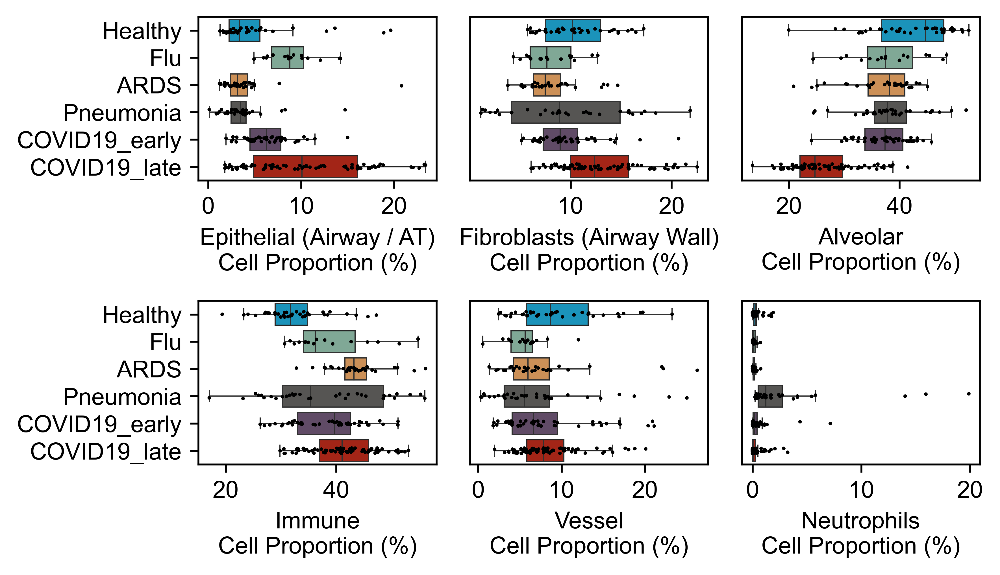

In [56]:
import pingouin as pg
import seaborn as sns
import matplotlib

matplotlib.rcParams["pdf.fonttype"] = 42
matplotlib.rcParams["ps.fonttype"] = 42
matplotlib.rcParams["axes.grid"] = False

utag_mat_proportion = utag_mat[['Alveolar', 'Fibroblasts (Airway Wall)', 'Vessel', 'Epithelial (Airway / AT)', 'Immune', 'Neutrophils', 'disease']]

pvals = []
fig, ax = plt.subplots(2, 3, figsize=(6,3.5), dpi = 300)
for i, domain in enumerate(utag_mat.columns[:-1]):
    i_, j_ = int(i / 3), i % 3
    
    x = utag_mat_proportion.loc[utag_mat_proportion["disease"] == "Healthy", domain]

    diseases = utag_mat_proportion["disease"].unique().to_list()
    pval = []
    for disease in diseases:
        if disease != "Healthy":
            y = utag_mat_proportion.loc[utag_mat_proportion["disease"] == disease, domain]

            p = pg.mwu(x=x.astype(float), y=y.astype(float))["p-val"].values[0]
            pval.append(p)
    pvals.append(pval)

    sns.boxplot(
        data=utag_mat_proportion,
        y="disease",
        x=domain,
        hue="disease",
        palette = disease_colors,
        dodge=False,
        fliersize=0,
        linewidth=0.5,
        ax=ax[i_][j_],
    )

    sns.stripplot(
        data=utag_mat_proportion,
        y="disease",
        x=domain,
        color = 'black',
        dodge=False,
        jitter=True,
        size=1.5,
        ax=ax[i_][j_],
    )
    # ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    ax[i_][j_].legend_ = None
    ax[i_][j_].set_yticklabels(ax[i_][j_].get_yticklabels(), fontsize = 10)
    plt.setp(ax[i_][j_].get_xticklabels(), fontsize=10)
    ax[i_][j_].set_xlabel(f"{domain}\nCell Proportion (%)", fontsize = 10)
    ax[i_][j_].set_ylabel("")
    if i % 3 != 0:
        ax[i_][j_].set_yticks([])

#ax[1][2].set_visible(False)
plt.tight_layout()
plt.savefig('figures/infected_lung_domain_distribution.pdf', bbox_inches = 'tight')
plt.show()

In [40]:
diseases

['ARDS', 'Pneumonia', 'Flu', 'COVID19_early', 'COVID19_late', 'Healthy']

In [70]:
pval_df = pd.DataFrame(
    pvals,
    index=utag_mat.columns[:-1],
    columns=['ARDS', 'Pneumonia', 'Flu', 'COVID19_early', 'COVID19_late'],
)

pval_adjusted_mat = pg.multicomp(pval_df.to_numpy().flatten(), method="fdr_bh")[
    1
].reshape(6, 5)
pval_adjusted_df = pd.DataFrame(
    pval_adjusted_mat,
    index=utag_mat.columns[:-1],
    columns=['ARDS', 'Pneumonia', 'Flu', 'COVID19_early', 'COVID19_late'],
)

pval_adjusted_df[["Flu", "ARDS", "Pneumonia", "COVID19_early", "COVID19_late"]].T.round(4)

,Epithelial (Airway / AT),Fibroblasts (Airway Wall),Alveolar,Immune,Vessel,Neutrophils
Flu,0.0002,0.0426,0.0671,0.0053,0.0186,0.0505
ARDS,0.5364,0.0072,0.0056,0.0000,0.0892,0.0223
Pneumonia,0.4580,0.5862,0.0308,0.0484,0.0426,0.0000
COVID19_early,0.0016,0.2884,0.0016,0.0007,0.2027,0.5572
COVID19_late,0.0000,0.0056,0.0000,0.0000,0.5862,0.0304


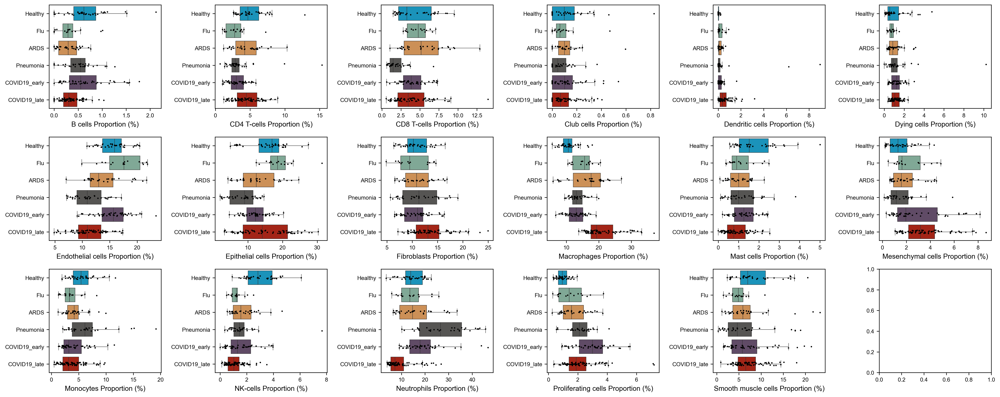

In [58]:
import seaborn as sns

pvals = []

fig, ax = plt.subplots(3, 6, figsize=(20, 8))
for i, cell_type_ in enumerate(cell_type_mat.columns[:-1]):
    i_, j_ = int(i / 6), i % 6
    diseases = cell_type_mat["disease"].unique().to_list()

    x = cell_type_mat.loc[cell_type_mat["disease"] == "Healthy", cell_type_]
    pval = []
    for disease in diseases:
        if disease != "Healthy":
            y = cell_type_mat.loc[cell_type_mat["disease"] == disease, cell_type_]

            p = pg.mwu(x=x.astype(float), y=y.astype(float))["p-val"].values[0]
            pval.append(p)
    pvals.append(pval)

    sns.boxplot(
        data=cell_type_mat,
        y="disease",
        x=cell_type_,
        hue="disease",
        palette = disease_colors,
        fliersize=0,
        linewidth=0.5,
        dodge=False,
        ax=ax[i_][j_],
    )

    sns.stripplot(
        data=cell_type_mat,
        y="disease",
        x=cell_type_,
        color = 'black',
        dodge=False,
        jitter=True,
        size=2,
        ax=ax[i_][j_],
    )

    ax[i_][j_].legend_ = None
    ax[i_][j_].set_ylabel("")
    ax[i_][j_].set_xlabel(f"{cell_type_} Proportion (%)")
plt.tight_layout()
plt.show()

In [59]:
pval_df = pd.DataFrame(
    pvals,
    index=cell_type_mat.columns[:-1],
    columns=["Flu", "ARDS", "Pneumonia", "COVID19_early", "COVID19_late"],
)

pval_adjusted_mat = pg.multicomp(pval_df.to_numpy().flatten(), method="fdr_bh")[
    1
].reshape(18, 5)
pval_adjusted_df = pd.DataFrame(
    pval_adjusted_mat,
    index=cell_type_mat.columns[:-1],
    columns=["Flu", "ARDS", "Pneumonia", "COVID19_early", "COVID19_late"],
)
pval_adjusted_df.round(6)

ValueError: cannot reshape array of size 85 into shape (18,5)

In [60]:
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

steps = [("pca", PCA())]


pca1 = PCA()
pca2 = PCA()

utag_mat = utag.iloc[:, 1:7]
cell_type_mat = cell_type.iloc[:, 1:-3]
utag_mat["disease"] = utag["phenotypes"]
cell_type_mat["disease"] = cell_type["phenotypes"]

utag_pca = pca1.fit_transform(
    utag_mat.iloc[:, :-1] / utag_mat.iloc[:, :-1].sum(axis=1)[:, np.newaxis]
)
cell_type_pca = pca2.fit_transform(
    cell_type_mat.iloc[:, :-1] / cell_type_mat.iloc[:, :-1].sum(axis=1)[:, np.newaxis]
)

utag_pca = pd.DataFrame(
    utag_pca,
    index=utag_mat.index,
    columns=[f"PC{i+1}" for i in range(utag_pca.shape[1])],
)
cell_type_pca = pd.DataFrame(
    cell_type_pca,
    index=cell_type_mat.index,
    columns=[f"PC{i+1}" for i in range(cell_type_pca.shape[1])],
)

utag_pca["disease"] = utag_mat["disease"]
cell_type_pca["disease"] = cell_type_mat["disease"]

C:\Users\jkim0\AppData\Local\Temp/ipykernel_24944/2423285595.py:17: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  utag_mat.iloc[:, :-1] / utag_mat.iloc[:, :-1].sum(axis=1)[:, np.newaxis]
C:\Users\jkim0\AppData\Local\Temp/ipykernel_24944/2423285595.py:20: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  cell_type_mat.iloc[:, :-1] / cell_type_mat.iloc[:, :-1].sum(axis=1)[:, np.newaxis]


In [61]:
pca1.explained_variance_ratio_

array([4.52386008e-01, 3.55077174e-01, 1.13433608e-01, 5.56766898e-02,
       2.34265205e-02, 3.06936329e-31])

In [62]:
cell_type_pca["PC1"] = -cell_type_pca["PC1"]
pca2.explained_variance_ratio_

array([4.32692274e-01, 1.67758974e-01, 1.60986382e-01, 8.09953680e-02,
       4.76444693e-02, 3.00126900e-02, 2.46530442e-02, 2.02397333e-02,
       1.23446770e-02, 8.22577336e-03, 4.58488100e-03, 3.76985854e-03,
       2.49928500e-03, 1.77051960e-03, 1.36391341e-03, 4.11481570e-04,
       4.66767999e-05, 7.04786184e-33])

In [63]:
pval = []
for disease in diseases:
    x = utag_pca.loc[utag_pca["disease"] == "Healthy", "PC1"]
    if disease != "Healthy":
        y = utag_pca.loc[utag_pca["disease"] == disease, "PC1"]

        p = pg.mwu(x=x.astype(float), y=y.astype(float))["p-val"].values[0]
        pval.append(p)

utag_adjusted_pval = pg.multicomp(pval, method="fdr_bh")

pval = []
for disease in diseases:
    x = cell_type_pca.loc[cell_type_pca["disease"] == "Healthy", "PC1"]
    if disease != "Healthy":
        y = cell_type_pca.loc[cell_type_pca["disease"] == disease, "PC1"]

        p = pg.mwu(x=x.astype(float), y=y.astype(float))["p-val"].values[0]
        pval.append(p)

cell_type_adjusted_pval = pg.multicomp(pval, method="fdr_bh")

adjusted_pvals = pd.DataFrame(
    {"UTAG": utag_adjusted_pval[1], "Celltype": cell_type_adjusted_pval[1]},
    index=diseases[:-1],
)
adjusted_pvals.loc[["Flu", "ARDS", "Pneumonia", "COVID19_early", "COVID19_late"]].round(
    6
)

,UTAG,Celltype
Flu,0.056937,0.076117
ARDS,0.019614,0.076117
Pneumonia,0.110665,0.000000
COVID19_early,0.002824,0.195092
COVID19_late,0.000000,0.000000


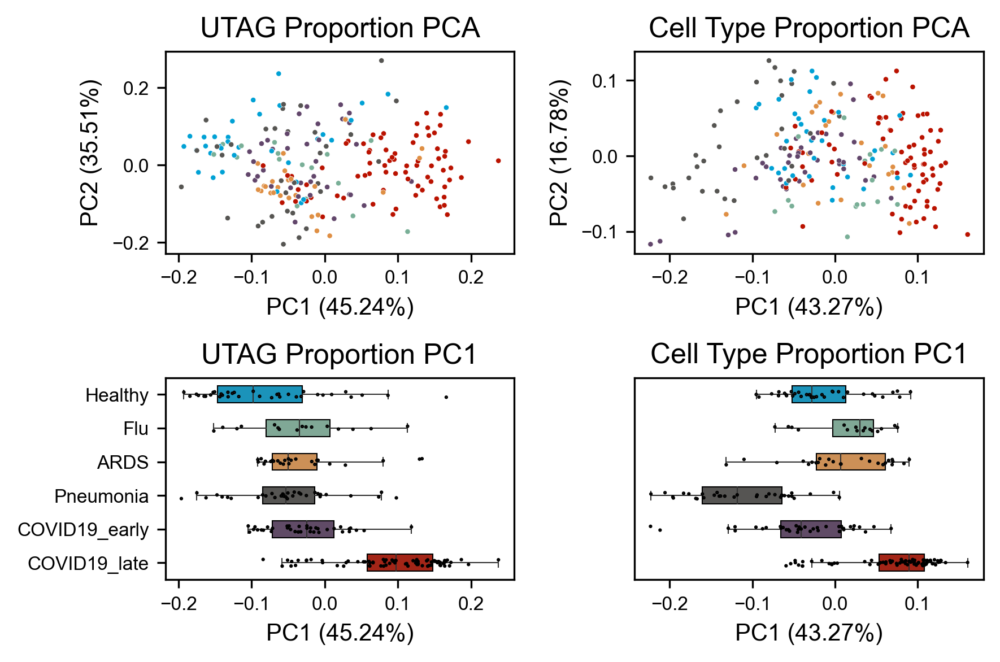

In [64]:
import matplotlib

matplotlib.rcParams["pdf.fonttype"] = 42
matplotlib.rcParams["ps.fonttype"] = 42
matplotlib.rcParams["axes.grid"] = False
matplotlib.rc("xtick", labelsize=8)
matplotlib.rc("ytick", labelsize=8)

fig, ax = plt.subplots(2, 2, figsize=(6, 4))

sns.scatterplot(data=utag_pca, x="PC1", y="PC2", hue="disease", s=5, ax=ax[0][0],palette = disease_colors)
ax[0][0].legend_ = None
ax[0][0].set_xlabel(
    "PC1 ({:.2f}%)".format(pca1.explained_variance_ratio_[0] * 100), fontsize=10
)
ax[0][0].set_ylabel(
    "PC2 ({:.2f}%)".format(pca1.explained_variance_ratio_[1] * 100), fontsize=10
)
ax[0][0].set_title("UTAG Proportion PCA", fontsize=12)

sns.scatterplot(data=cell_type_pca, x="PC1", y="PC2", hue="disease", s=5, ax=ax[0][1],palette = disease_colors,)
ax[0][1].legend_ = None
ax[0][1].set_title("Cell Type Proportion PCA", fontsize=12)
ax[0][1].set_ylabel(
    "PC2 ({:.2f}%)".format(pca2.explained_variance_ratio_[1] * 100), fontsize=10
)
ax[0][1].set_xlabel(
    "PC1 ({:.2f}%)".format(pca2.explained_variance_ratio_[0] * 100), fontsize=10
)

sns.boxplot(
    data=utag_pca,
    x="PC1",
    y="disease",
    hue="disease",
    palette = disease_colors,
    fliersize=0,
    linewidth=0.5,
    ax=ax[1][0],
    width=0.5,
    dodge=False,
)
sns.stripplot(
    data=utag_pca,
    x="PC1",
    y="disease",
    hue="disease",
    dodge=False,
    jitter=True,
    size=1,
    ax=ax[1][0],
    linewidth=0.5,
    color="black",
)
ax[1][0].legend_ = None
ax[1][0].set_title("UTAG Proportion PC1", fontsize=12)
ax[1][0].set_ylabel("")
ax[1][0].set_xlabel(
    "PC1 ({:.2f}%)".format(pca1.explained_variance_ratio_[0] * 100), fontsize=10
)
for box in ax[1][0].artists:
    box.set_edgecolor("black")

sns.boxplot(
    data=cell_type_pca,
    x="PC1",
    y="disease",
    hue="disease",
    palette = disease_colors,
    fliersize=0,
    linewidth=0.5,
    ax=ax[1][1],
    width=0.5,
    dodge=False,
)
sns.stripplot(
    data=cell_type_pca,
    x="PC1",
    y="disease",
    hue="disease",
    dodge=False,
    jitter=True,
    size=1,
    ax=ax[1][1],
    linewidth=0.5,
    color="black",
)
ax[1][1].legend_ = None
ax[1][1].get_yaxis().set_visible(False)
ax[1][1].set_title("Cell Type Proportion PC1", fontsize=12)
ax[1][1].set_ylabel("")
ax[1][1].set_xlabel(
    "PC1 ({:.2f}%)".format(pca2.explained_variance_ratio_[0] * 100), fontsize=10
)
for box in ax[1][1].artists:
    box.set_edgecolor("black")


plt.tight_layout()
# plt.show()
plt.savefig("figures/infected_PCA_fig3c.pdf", bbox_inches="tight")

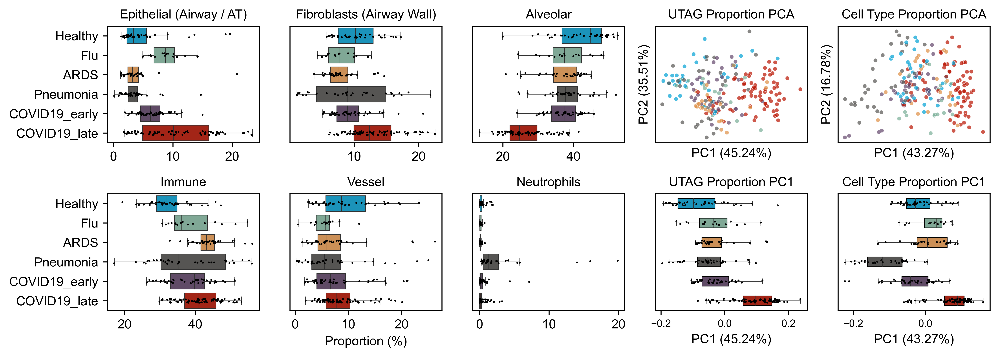

In [69]:
import pingouin as pg
import seaborn as sns
import matplotlib

matplotlib.rcParams["pdf.fonttype"] = 42
matplotlib.rcParams["ps.fonttype"] = 42
matplotlib.rcParams["axes.grid"] = False

utag_mat_proportion = utag_mat_proportion[['Alveolar', 'Fibroblasts (Airway Wall)', 'Vessel', 'Epithelial (Airway / AT)', 'Immune', 'Neutrophils', 'disease']]

pvals = []
fig, ax = plt.subplots(2, 5, figsize=(11,4), dpi = 300)
for i, domain in enumerate(utag_mat.columns[:-1]):
    i_, j_ = int(i / 3), i % 3
    
    x = utag_mat_proportion.loc[utag_mat_proportion["disease"] == "Healthy", domain]

    diseases = utag_mat_proportion["disease"].unique().to_list()
    pval = []
    for disease in diseases:
        if disease != "Healthy":
            y = utag_mat_proportion.loc[utag_mat_proportion["disease"] == disease, domain]

            p = pg.mwu(x=x.astype(float), y=y.astype(float))["p-val"].values[0]
            pval.append(p)
    pvals.append(pval)

    sns.boxplot(
        data=utag_mat_proportion,
        y="disease",
        x=domain,
        hue="disease",
        palette = disease_colors,
        dodge=False,
        fliersize=0,
        linewidth=0.5,
        ax=ax[i_][j_],
    )

    sns.stripplot(
        data=utag_mat_proportion,
        y="disease",
        x=domain,
        color = 'black',
        dodge=False,
        jitter=True,
        size=1.5,
        ax=ax[i_][j_],
    )
    # ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    ax[i_][j_].legend_ = None
    ax[i_][j_].set_yticklabels(ax[i_][j_].get_yticklabels(), fontsize = 10)
    plt.setp(ax[i_][j_].get_xticklabels(), fontsize=10)
    ax[i_][j_].set_title(f"{domain}", fontsize = 10)
    
    ax[i_][j_].set_xlabel("", fontsize = 10)
    ax[i_][j_].set_ylabel("")
    if i % 3 != 0:
        ax[i_][j_].set_yticks([])

ax[1][1].set_xlabel(f"Proportion (%)", fontsize = 10)

sns.scatterplot(data=utag_pca, x="PC1", y="PC2", hue="disease", s=10, alpha = 0.7, ax=ax[0][3],palette = disease_colors)
ax[0][3].legend_ = None
ax[0][3].set_xlabel(
    "PC1 ({:.2f}%)".format(pca1.explained_variance_ratio_[0] * 100), fontsize=10
)
ax[0][3].set_ylabel(
    "PC2 ({:.2f}%)".format(pca1.explained_variance_ratio_[1] * 100), fontsize=10
)
ax[0][3].set_xticks([])
ax[0][3].set_yticks([])
ax[0][3].set_title("UTAG Proportion PCA", fontsize=10)

sns.scatterplot(data=cell_type_pca, x="PC1", y="PC2", hue="disease", s=10, alpha = 0.7, ax=ax[0][4],palette = disease_colors,)
ax[0][4].legend_ = None
ax[0][4].set_title("Cell Type Proportion PCA", fontsize=10)
ax[0][4].set_xticks([])
ax[0][4].set_yticks([])
ax[0][4].set_ylabel(
    "PC2 ({:.2f}%)".format(pca2.explained_variance_ratio_[1] * 100), fontsize=10
)
ax[0][4].set_xlabel(
    "PC1 ({:.2f}%)".format(pca2.explained_variance_ratio_[0] * 100), fontsize=10
)

sns.boxplot(
    data=utag_pca,
    x="PC1",
    y="disease",
    hue="disease",
    palette = disease_colors,
    fliersize=0,
    linewidth=0.5,
    ax=ax[1][3],
    width=0.5,
    dodge=False,
)
sns.stripplot(
    data=utag_pca,
    x="PC1",
    y="disease",
    hue="disease",
    dodge=False,
    jitter=True,
    size=1,
    ax=ax[1][3],
    linewidth=0.5,
    color="black",
)
ax[1][3].legend_ = None
ax[1][3].set_title("UTAG Proportion PC1", fontsize=10)
ax[1][3].set_ylabel("")
ax[1][3].set_xlabel(
    "PC1 ({:.2f}%)".format(pca1.explained_variance_ratio_[0] * 100), fontsize=10
)
ax[1][3].set_yticks([])

for box in ax[1][3].artists:
    box.set_edgecolor("black")

sns.boxplot(
    data=cell_type_pca,
    x="PC1",
    y="disease",
    hue="disease",
    palette = disease_colors,
    fliersize=0,
    linewidth=0.5,
    ax=ax[1][4],
    width=0.5,
    dodge=False,
)
sns.stripplot(
    data=cell_type_pca,
    x="PC1",
    y="disease",
    hue="disease",
    dodge=False,
    jitter=True,
    size=1,
    ax=ax[1][4],
    linewidth=0.5,
    color="black",
)
ax[1][4].legend_ = None
ax[1][4].get_yaxis().set_visible(False)
ax[1][4].set_title("Cell Type Proportion PC1", fontsize=10)
ax[1][4].set_ylabel("")
ax[1][4].set_xlabel(
    "PC1 ({:.2f}%)".format(pca2.explained_variance_ratio_[0] * 100), fontsize=10
)
for box in ax[1][4].artists:
    box.set_edgecolor("black")

plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)

plt.tight_layout()
#plt.show()
#plt.savefig("figures/infected_PCA_fig3_reformatted.pdf", bbox_inches="tight")